# Plotting the average pairwise coalescence times between species across different types of windows

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

import os
import gzip
import toytree
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import subprocess
import pickle

from utils import digest, load_split_heights

In [2]:
ymax = 600000
ymin = 0

color_pal = {"roem_cusp": "#FFCC00",
             "drum_cusp": "#7570B3",
             "drum_roem": "#000000"}

# ensure pdf text is rendered as type not path
plt.rcParams['pdf.fonttype'] = 42 

# Load data

### Make a list of results folders

In [3]:
fail_folders = ['outlier_windows.shared.drum.1_1103500000_1103750000.rep1.DP_5.vcf.gz',
                'outlier_windows.shared.roem.1_1126000000_1126250000.rep1.DP_5.vcf.gz',
                'samp_windows.1_1088750000_1089000000.rep1.DP_5.vcf.gz',
                'samp_windows.1_1103250000_1103500000.rep1.DP_5.vcf.gz',
                'samp_windows.2_1010750000_1011000000.rep1.DP_5.vcf.gz',
                'samp_windows.1_1101750000_1102000000.rep1.DP_5.vcf.gz',
                'samp_windows.2_1134250000_1134500000.rep1.DP_5.vcf.gz']

all_folders = {}
for k in ['drum', 'roem', 'samp']:
    if k == 'samp':
        run_folder = './argweaver_runs/samp_windows'
    else:
        run_folder = './argweaver_runs/outlier_windows'
        
    all_folders[k] = [i for i in os.listdir(run_folder) if k in i]
    
    # ignore failed runs
    for f in fail_folders:
        if k in f:
            all_folders[k].remove(f)
            
    all_folders[k] = [os.path.join(run_folder, i) for i in all_folders[k]]

## Load

Save data to a pickle file to save on loading in the future

In [4]:
post_heights = {}

for k in all_folders.keys():
    pkl_fn = './pickle/{}.pkl'.format(digest(all_folders[k]))
    
    if os.path.exists(pkl_fn):
        post_heights[k] = pickle.load(open(pkl_fn, 'rb'))
    else:
        post_heights[k] = load_split_heights(all_folders[k])
        pickle.dump(post_heights[k], open(pkl_fn, 'wb'))

## Calculate mean heights

In [5]:
mean_heights = {}
for w in post_heights.keys():
    mean_heights[w] = {}
    for k in post_heights[w].keys():
        mean_heights[w][k] = np.array([
            x[:,0,:].mean(axis=1)
            for x in post_heights[w][k]
        ])

# drummondii-cuspidata outlier windows

### Make plots of pairwise coalescence times between species

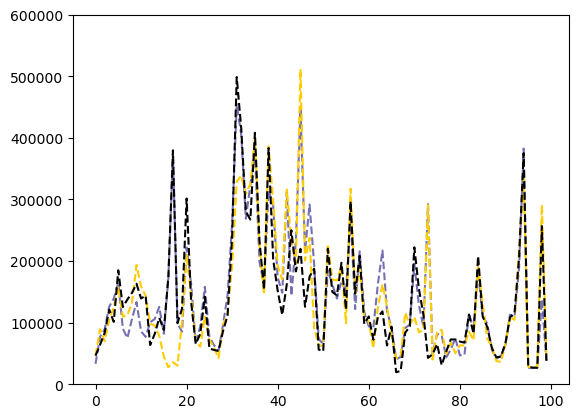

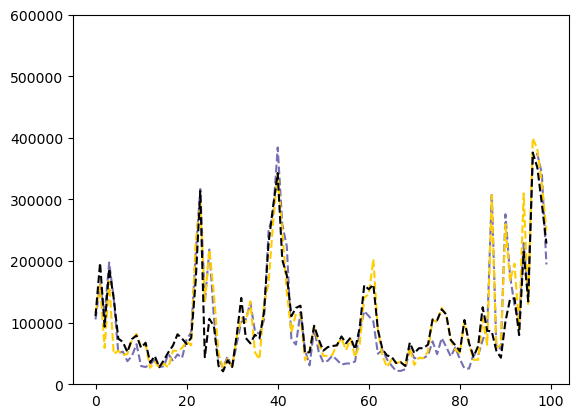

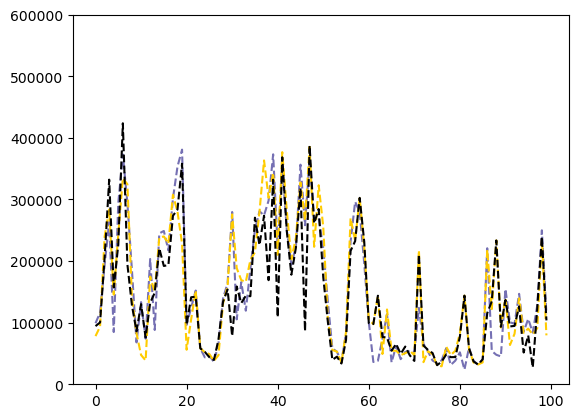

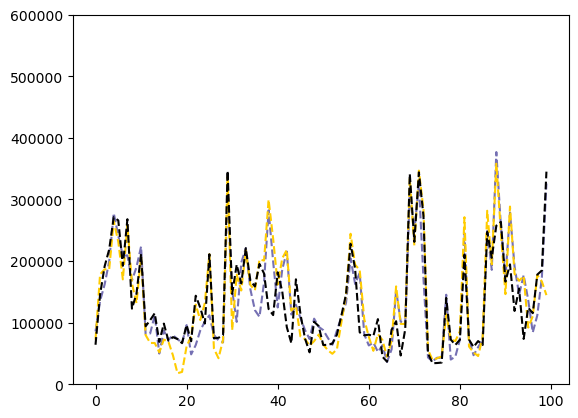

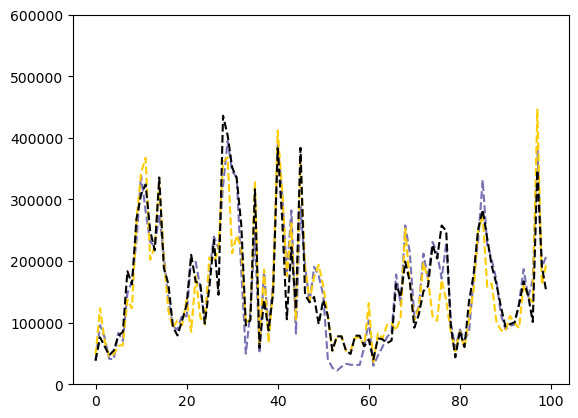

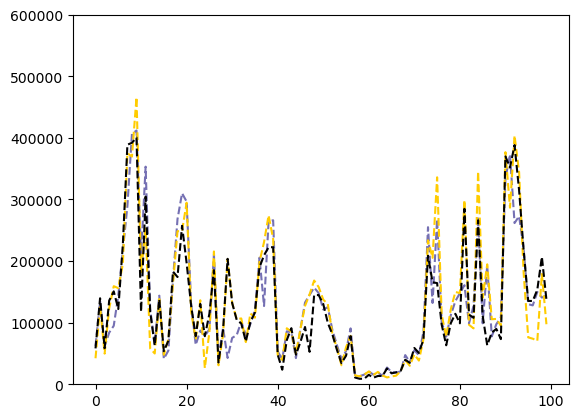

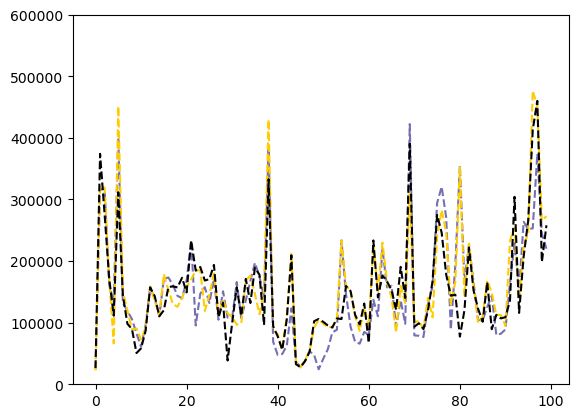

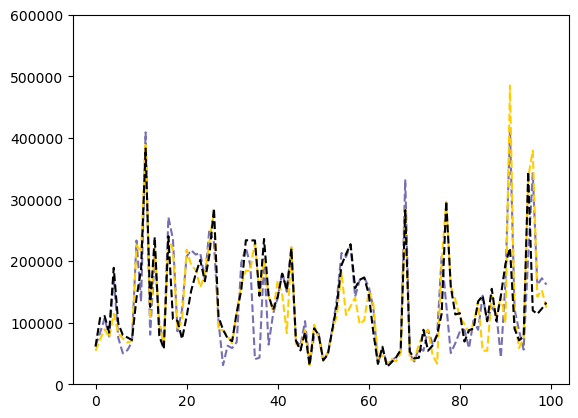

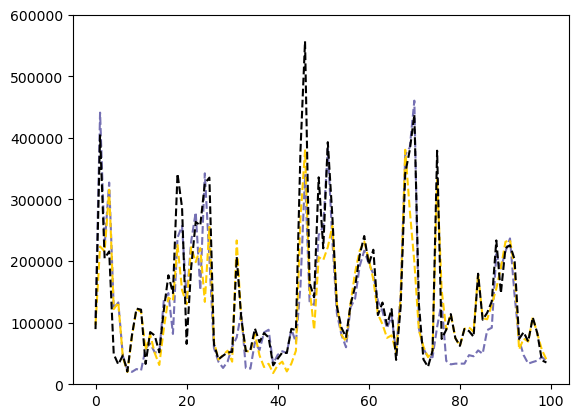

In [6]:
w = 'drum'
for i, folder in enumerate(all_folders[w]):
    region_start = int(folder.split('.')[4].split('_')[1])
    region_stop = int(folder.split('.')[4].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)    

    plt.plot(mean_heights[w]['cd'][i],
         color=color_pal["drum_cusp"], linestyle='--')

    plt.plot(mean_heights[w]['cr'][i],
             color=color_pal["roem_cusp"], linestyle='--')
    
    plt.plot(mean_heights[w]['dr'][i],
             color=color_pal["drum_roem"], linestyle='--')

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/{w}/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
purple = avg pairwise CD coalescence time  
yellow = avg pairwise CR coalescence time  

# roemeriana-cuspidata outlier windows

### Make plots of pairwise coalescence times between species

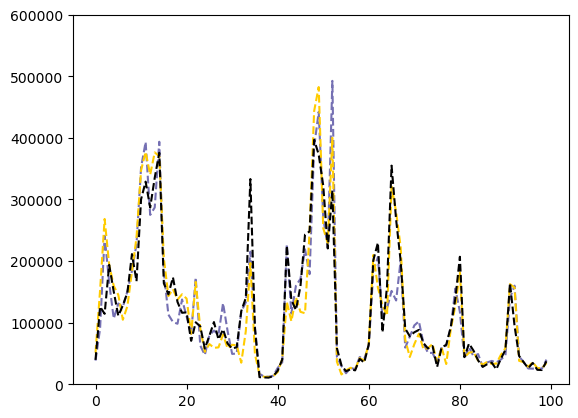

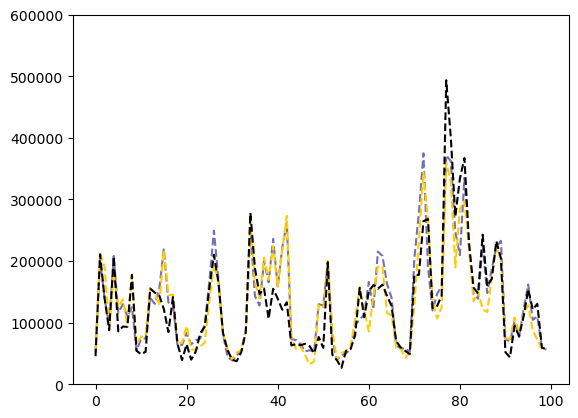

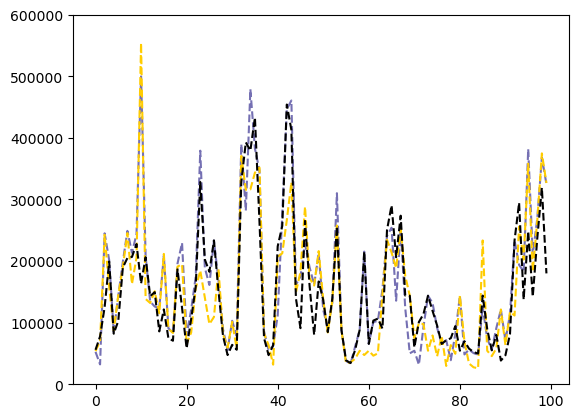

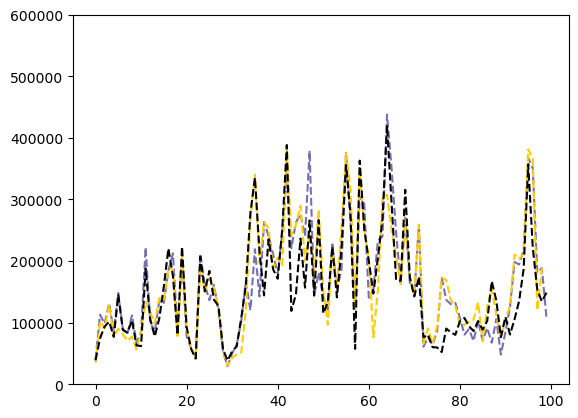

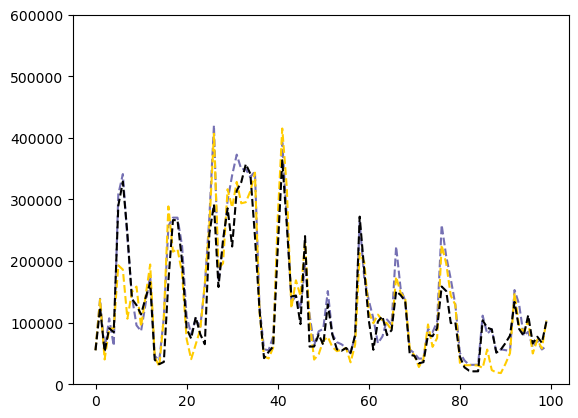

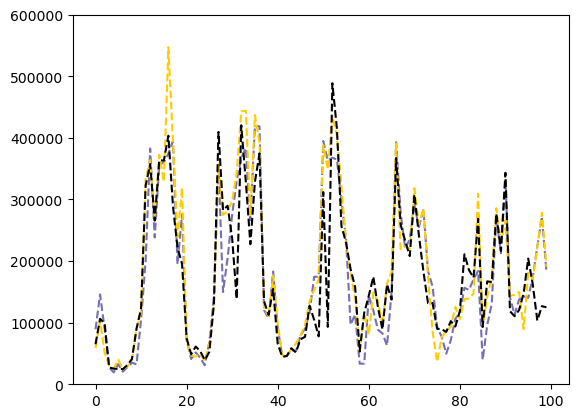

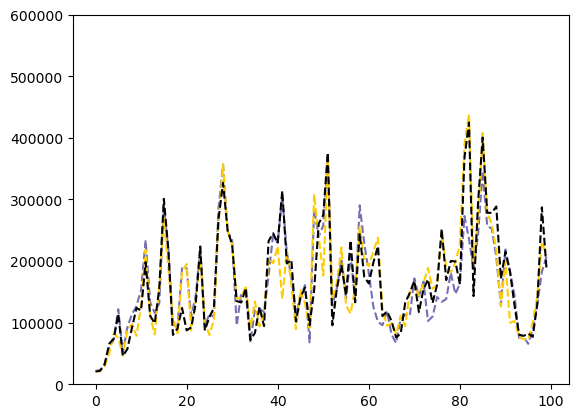

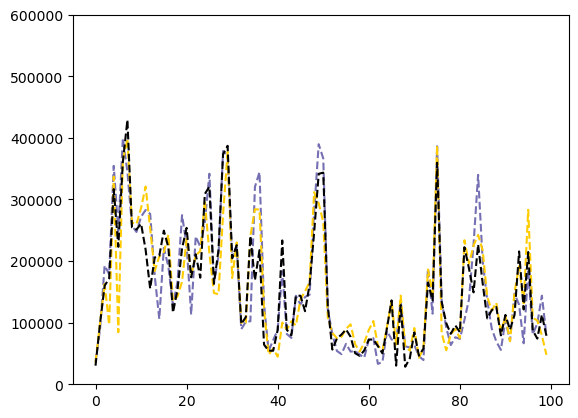

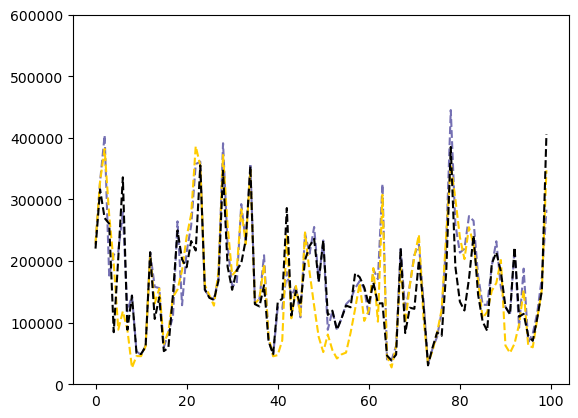

In [7]:
w = 'roem'
for i, folder in enumerate(all_folders[w]):
    region_start = int(folder.split('.')[4].split('_')[1])
    region_stop = int(folder.split('.')[4].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)
    
    plt.plot(mean_heights[w]['cd'][i],
         color=color_pal["drum_cusp"], linestyle='--')

    plt.plot(mean_heights[w]['cr'][i],
             color=color_pal["roem_cusp"], linestyle='--')
    
    plt.plot(mean_heights[w]['dr'][i],
             color=color_pal["drum_roem"], linestyle='--')

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/{w}/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
purple = avg pairwise CD coalescence time  
yellow = avg pairwise CR coalescence time  

# Randomly sampled windows

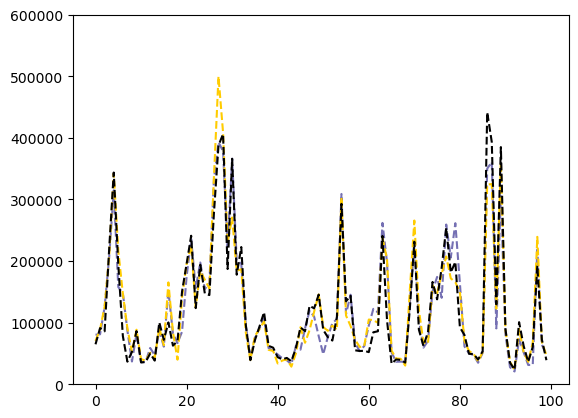

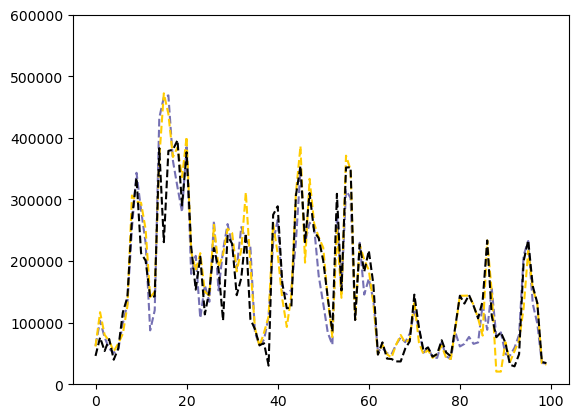

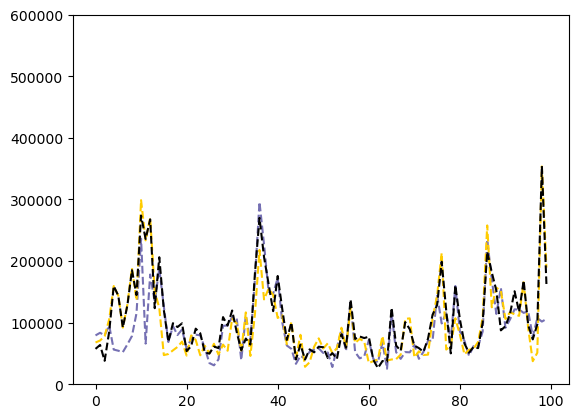

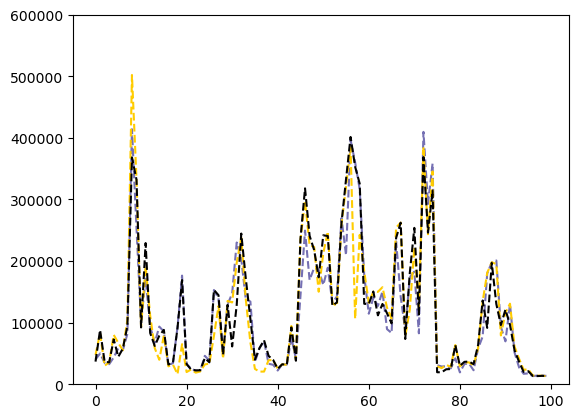

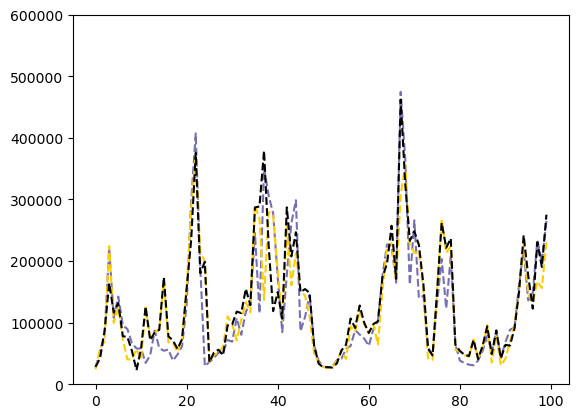

...

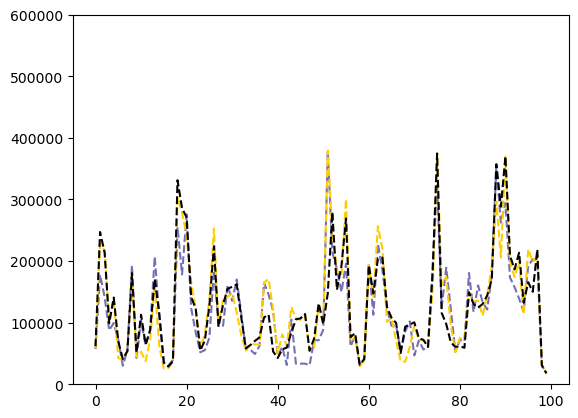

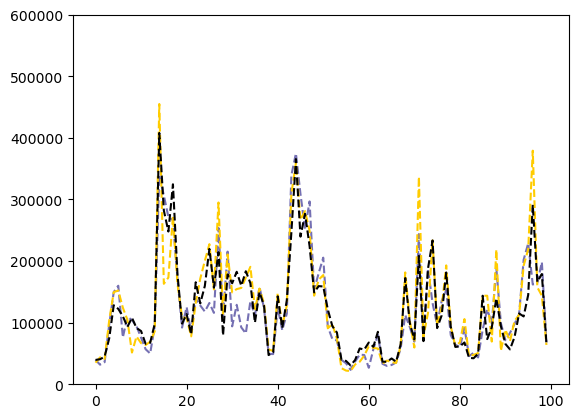

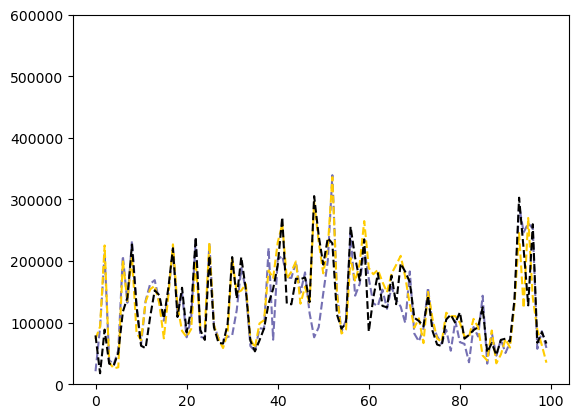

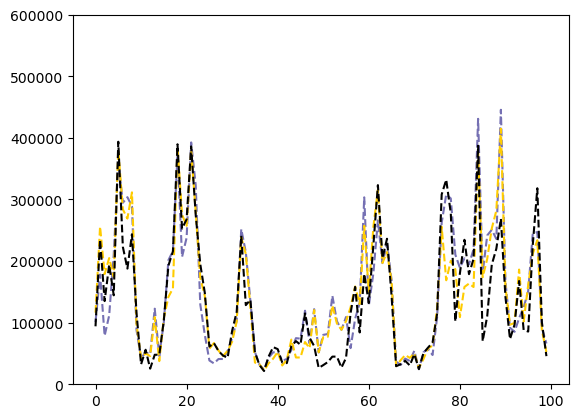

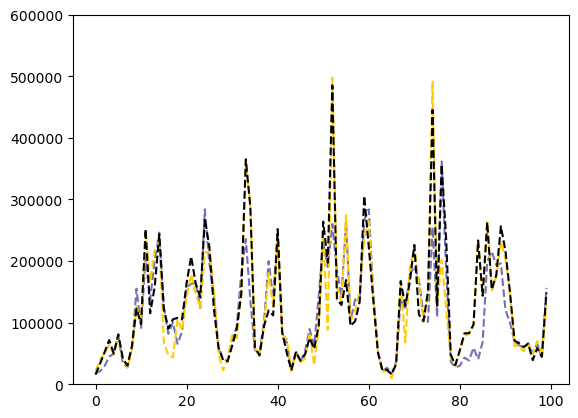

In [8]:
w = 'samp'
for i, folder in enumerate(all_folders[w]):
    region_start = int(folder.split('.')[2].split('_')[1])
    region_stop = int(folder.split('.')[2].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)

    plt.plot(mean_heights[w]['cd'][i],
         color=color_pal["drum_cusp"], linestyle='--')

    plt.plot(mean_heights[w]['cr'][i],
             color=color_pal["roem_cusp"], linestyle='--')
    
    plt.plot(mean_heights[w]['dr'][i],
             color=color_pal["drum_roem"], linestyle='--')

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/{w}/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
purple = avg pairwise CD coalescence time  
yellow = avg pairwise CR coalescence time  

# Identify discordant stretches

In [9]:
kernel_size = 4 # equivalent to 10kb (since 100 points in a 250 kb window)

for w in mean_heights.keys():
    print(w)
    for k in ['cd', 'cr']:
        pass_pos = (mean_heights[w][k] / mean_heights[w]['dr']) < 0.85
        post_conv = np.array([
            np.convolve(row, np.ones(kernel_size, dtype=int), 'valid')
            for row in pass_pos
        ])
        prop = (post_conv == kernel_size).sum() / np.product(post_conv.shape)
        print('  {}: {}'.format(k, prop))

drum
  cd: 0.05154639175257732
  cr: 0.022909507445589918
roem
  cd: 0.0057273768613974796
  cr: 0.021764032073310423
samp
  cd: 0.017905588714053174
  cr: 0.018665219750406945


In [10]:
(0.017905588714053174 + 0.018665219750406945) / 2

0.01828540423223006